# Chips preprocessing
In this notebook we explore, color normalization between multiple image. This leads to the notebook "Chips_colors_thresholds.ipynb" for finding threshold for each color. 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.insert(0, '../src/')


import os
import cv2
import numpy as np
import PIL.Image
import pandas as pd
from math import floor
import matplotlib.pyplot as plt

from table_extractor import TableExtractor
from chip_counter import ChipCounter
from collections import defaultdict
from research_helpers import load_train_imgs
from utility_functions import crop

### Load train images and extract chips area

In [3]:
images = load_train_imgs()

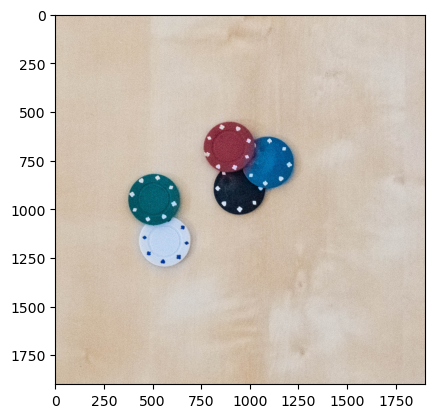

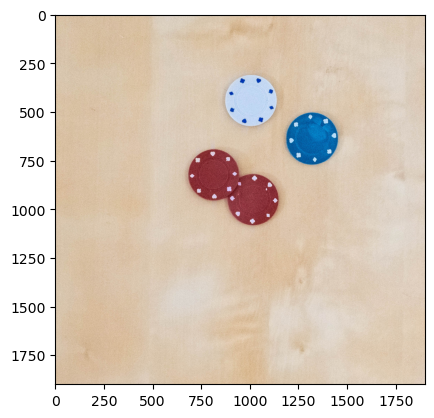

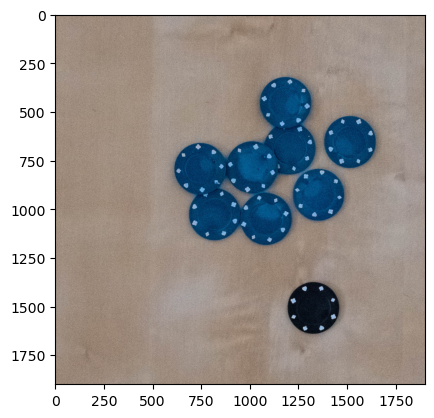

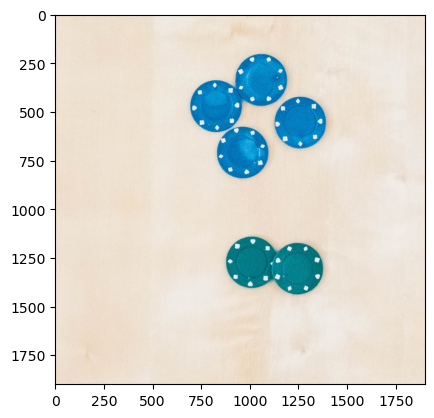

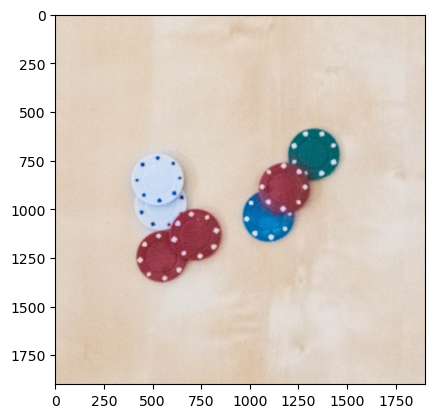

...

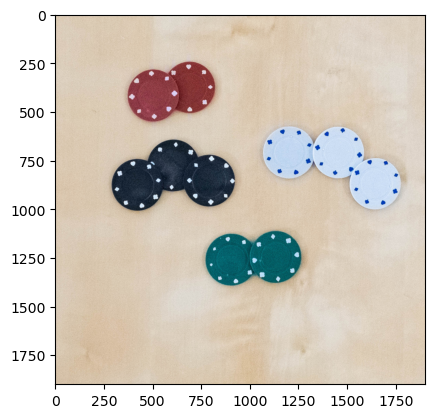

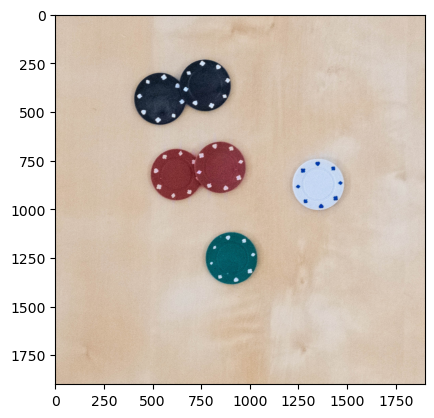

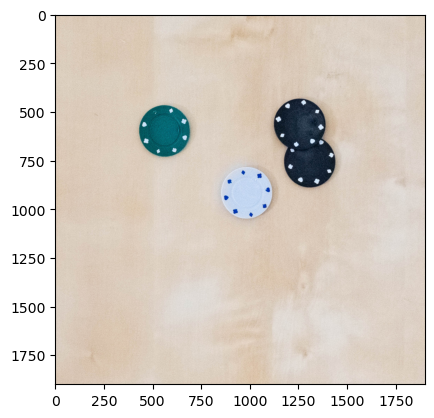

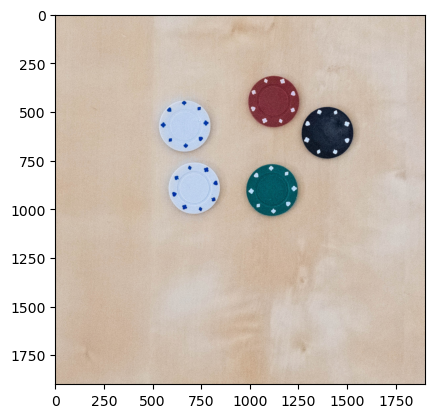

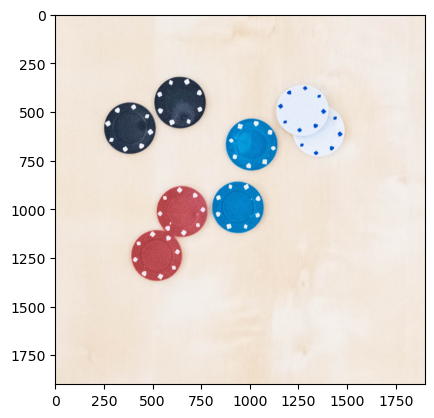

In [73]:
CHIPS_BOUNDARIES = [0.25,0.75,0.25,0.75]

chips_imgs = []
for img in images:
    table_img = TableExtractor.extract_table(img,plot=False)
    chips_img = crop(table_img,CHIPS_BOUNDARIES)
    chips_imgs.append(chips_img)
    plt.imshow(chips_img)
    plt.show()

### Normalize brightness to a mean std and mean mean

In [30]:
def brightness_stats(img):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h,s,v = cv2.split(img_hsv)
    return v.mean(), v.std()

In [31]:
def normalize_brightness(img):
    V_MEAN = 180.0
    V_STD = 47.0
    
    img_v_mean, img_v_std = brightness_stats(img)
    
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h,s,v = cv2.split(img_hsv.astype("float32"))
    
    v -= img_v_mean
    v *= (img_v_std / V_STD)
    v += V_MEAN
    v = np.clip(v, 0, 255)
    
    transfer = cv2.merge([h, s, v])
    transfer = cv2.cvtColor(transfer.astype("uint8"), cv2.COLOR_HSV2RGB)
    
    return transfer

In [32]:
norm_bright_imgs = []
for c in chips_imgs:
    new_c = normalize_brightness(c)
    norm_bright_imgs.append(new_c)

### Merge chips images
A image that contains almost all chips from training images will help to find the threshold for each color

In [8]:
def concat_imgs(imgs):
    #Create overall image by concatenating 25 out of 28 partitions
    chips_all = None
    for i in range(5):
        chips_row = None
        for j in range(5):
            chips = imgs[i*5+j]
            if(type(chips_row)==type(None)):
                chips_row = chips
            else:
                chips_row = np.concatenate([chips_row,chips],axis=1)
        if(type(chips_all)==type(None)):
            chips_all = chips_row
        else:
            chips_all = np.concatenate([chips_all,chips_row],axis=0)

        chips_row = None

    chips_all = cv2.medianBlur(chips_all,ksize=51)
    plt.imshow(chips_all)
    plt.show()

    chips_reduced = cv2.resize(chips_all, (2000,2000), interpolation = cv2.INTER_AREA)
    plt.imshow(chips_reduced)
    plt.show()
    
    return chips_reduced

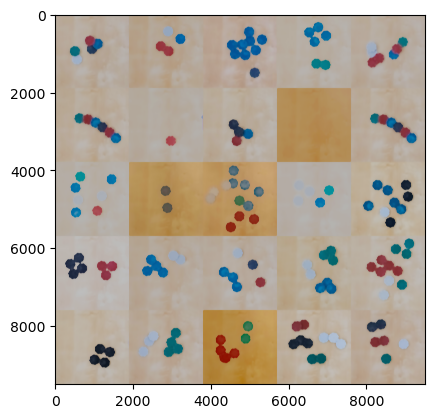

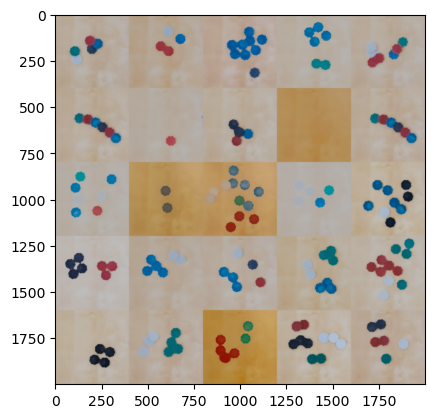

In [9]:
merge_img = concat_imgs(norm_bright_imgs)

In [10]:
from PIL import Image
Image.fromarray(merge_img).save("../data/chips/aligned_bright_chips.png")

### Naive trial of background RGB alignment - Unused

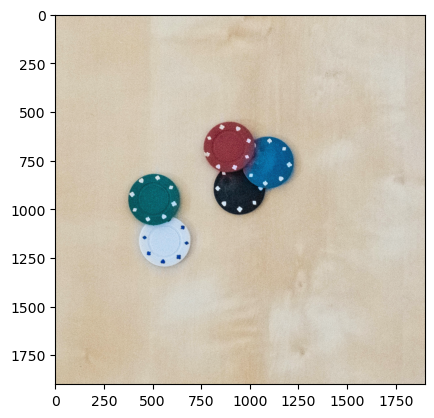

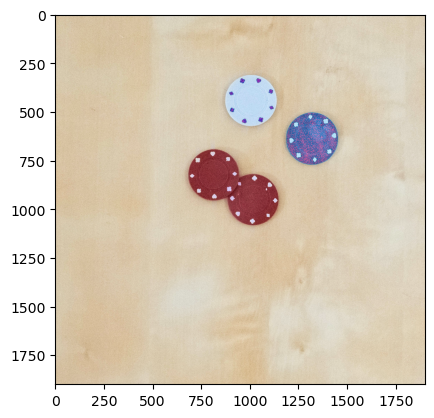

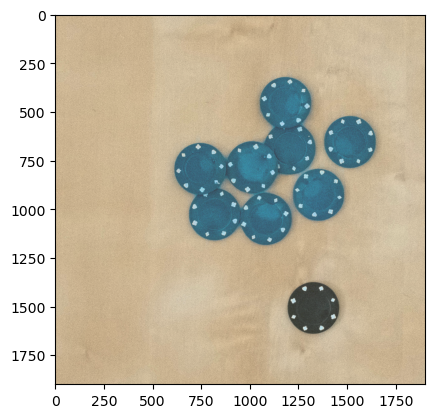

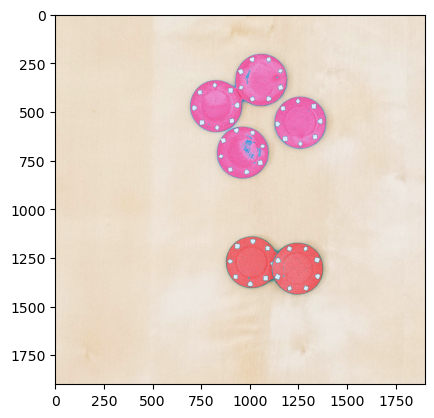

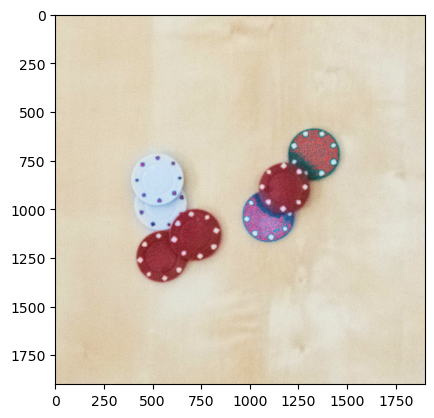

...

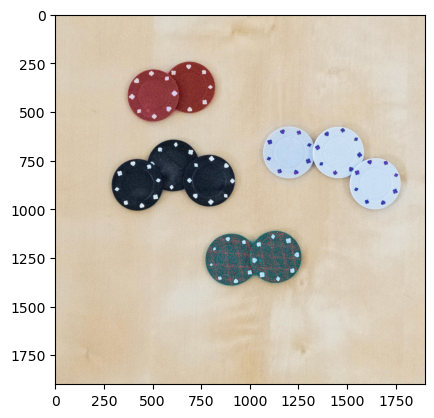

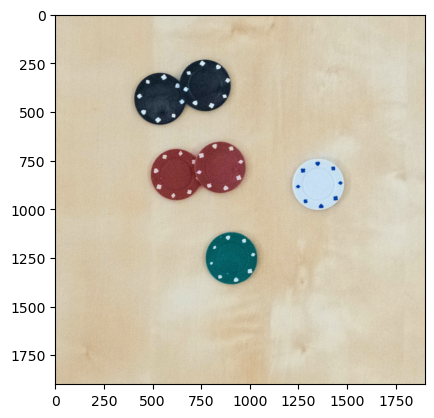

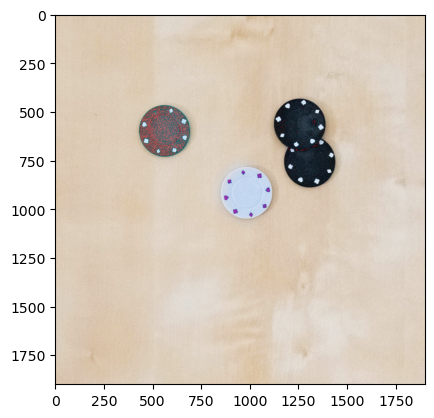

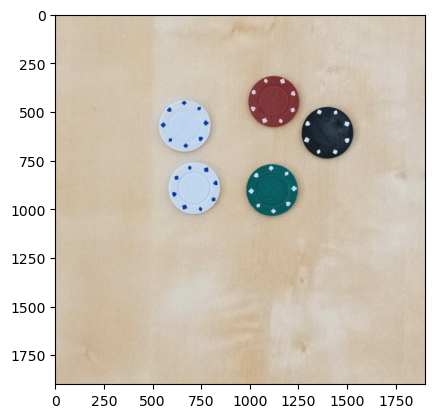

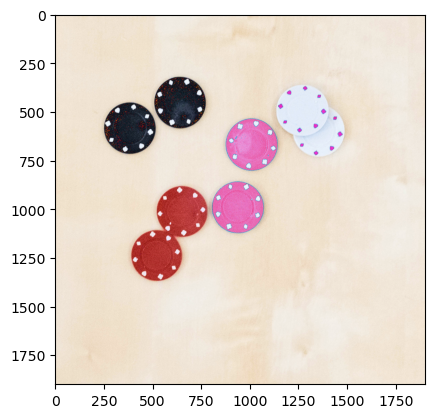

In [11]:
total = np.zeros(3)
for c in chips_imgs:
    gray = cv2.cvtColor(c, cv2.COLOR_BGR2GRAY)
    flag, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)

    bin_tresh = thresh > 0

    total += c[bin_tresh].mean(axis=0)
    
ref = total / len(chips_imgs)

aligned_colors = []
for c in chips_imgs:
    
    gray = cv2.cvtColor(c, cv2.COLOR_BGR2GRAY)
    flag, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)

    bin_tresh = thresh > 0

    c_mean_background = c[bin_tresh].mean(axis=0)
    
    cc = c.copy()
    cc = (cc - (c_mean_background - ref).astype(int))
    
    cc = (cc / cc.max(axis=(0, 1)) * 255).astype(int)
    cc = cc.astype("uint8")
    
    aligned_colors.append(cc)
    plt.imshow(cc)
    plt.show()

### Create color label to rgb mean
We compute the average color for each detected circle in the image.
Then we use kmeans to find the 5 colors centers. 
Using color center to classify chips'color is less robust than using thresholding. 
We use it as backup in case the color of the chips fall outside of the thresholds. 

In [4]:
table_imgs = []
for i, img in enumerate(images):
    print(f"Extract table: {i}")
    table_img = TableExtractor.extract_table(img,plot=False)
    table_imgs.append(table_img)

Extract table: 0
Extract table: 1
Extract table: 2
Extract table: 3
Extract table: 4
Extract table: 5
Extract table: 6
Extract table: 7
Extract table: 8
Extract table: 9
Extract table: 10
Extract table: 11
Extract table: 12
Extract table: 13
Extract table: 14
Extract table: 15
Extract table: 16
Extract table: 17
Extract table: 18
Extract table: 19
Extract table: 20
Extract table: 21
Extract table: 22
Extract table: 23
Extract table: 24
Extract table: 25
Extract table: 26
Extract table: 27


In [7]:
means = []
for i,t in enumerate(table_imgs):
    print(f"Game {i}")
    means.extend(ChipCounter.compute_mean_hsv_chips(t))
len(means)

Game 0
Game 1
Game 2
Game 3
Game 4
Game 5
Game 6
Game 7
Game 8
Game 9
Game 10
Game 11
Game 12
Game 13
Game 14
Game 15
Game 16
Game 17
Game 18
Game 19
Game 20
Game 21
Game 22
Game 23
Game 24
Game 25
Game 26
Game 27


170

In [14]:
from sklearn.cluster import KMeans

kmeans = KMeans(   init="random",    n_clusters=5,    n_init=10,   max_iter=300)

means_hsv = np.array(means).reshape(-1,1,3).astype("uint8")
means_rgb = cv2.cvtColor(means_hsv, cv2.COLOR_HSV2RGB)

kmeans.fit(means_rgb[:,0,:])

KMeans(init='random', n_clusters=5)

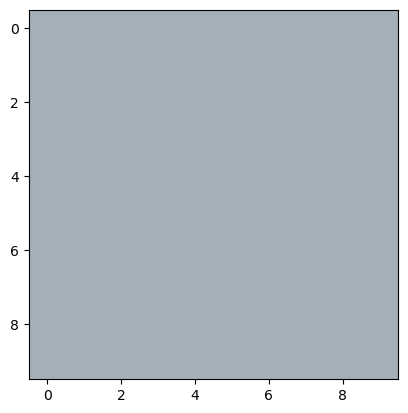

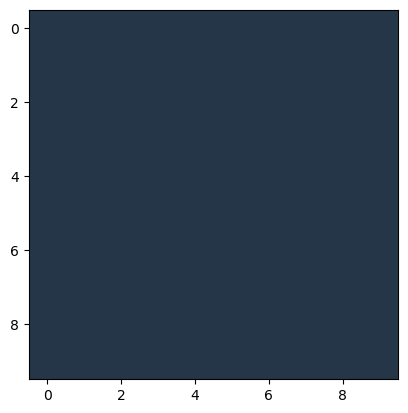

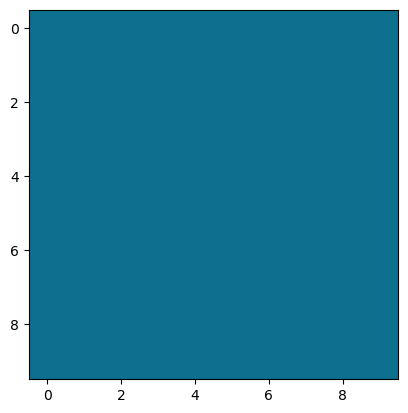

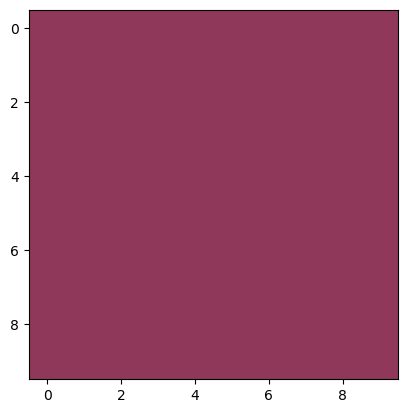

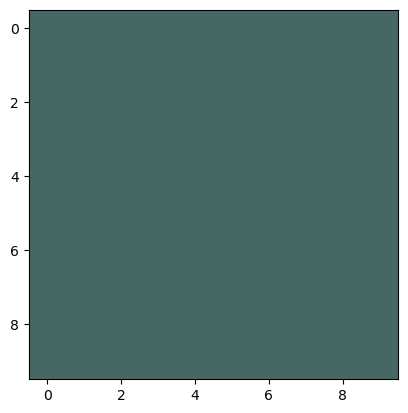

In [15]:
for c in kmeans.cluster_centers_:
    arr = np.zeros((10, 10, 3))
    arr[:,:] = c
    plt.imshow(arr.astype(int))
    plt.show()

In [16]:
# TODO adapt the label to the detected colors
labels = ["CW", "CK", "CB", "CR", "CG"]

In [17]:
chips_label_to_color = {}

for l,c in zip(labels, kmeans.cluster_centers_):
    chips_label_to_color[l] = c
    
chips_label_to_color

{'CW': array([165.93548387, 175.90322581, 184.29032258]),
 'CK': array([37.95652174, 54.08695652, 72.52173913]),
 'CB': array([ 14.63076923, 111.58461538, 143.61538462]),
 'CR': array([144.08823529,  56.88235294,  89.32352941]),
 'CG': array([ 71.41176471, 103.23529412, 100.88235294])}

In [19]:
import pickle
from constants import PATH_CHIPS

with open(PATH_CHIPS + 'chips_color_mean.pickle', 'wb') as handle:
    pickle.dump(chips_label_to_color, handle, protocol=pickle.HIGHEST_PROTOCOL)